## AZURE with Python

https://learn.microsoft.com/en-us/azure/storage/blobs/storage-quickstart-blobs-python?tabs=managed-identity%2Croles-azure-portal%2Csign-in-azure-cli&pivots=blob-storage-quickstart-scratch

Azure Blob Storage is optimized for storing massive amounts of unstructured data. Unstructured data is data that doesn't adhere to a particular data model or definition, such as text or binary data. Blob storage offers three types of resources:

- The storage account

  - A container in the storage account

    - A blob in the container

**Step-1**

**Install the Packages**

In [1]:
!pip install azure-storage-blob azure-identity

Use the following Python classes to interact with these resources:

**BlobServiceClient:** The BlobServiceClient class allows you to manipulate Azure Storage resources and blob containers.

**ContainerClient:** The ContainerClient class allows you to manipulate Azure Storage containers and their blobs.

**BlobClient:** The BlobClient class allows you to manipulate Azure Storage blobs.

## Create Container

Create a new container in your storage account by calling the create_container method on the blob_service_client object

- we need to access azure account

- we need to access the corresponding sotrage details

- BlobServiceClient Expecting two arguments

  - account_url

  - credential

In [2]:
from azure.storage.blob import BlobServiceClient

In [ ]:
blob_account_url='https://'-------'.blob.core.windows.net' 
# user must enter valid container name before .BLOB
storage_credential='Access KEY Need to Download From AZURE PORTAL'

blob_service_client=BlobServiceClient(account_url=blob_account_url,credential=storage_credential)

blob_service_client

**Method-1**

- we will create the container using blob service client

In [4]:
# Create the container
new_container=blob_service_client.create_container("vscodecontainer",public_access="container")
new_container

In [5]:
new_container.get_container_properties()

{'name': 'vscodecontainer', 'last_modified': datetime.datetime(2025, 6, 29, 10, 13, tzinfo=datetime.timezone.utc), 'etag': '"0x8DDB6F587095E03"', 'lease': {'status': 'unlocked', 'state': 'available', 'duration': None}, 'public_access': 'container', 'has_immutability_policy': False, 'deleted': None, 'version': None, 'has_legal_hold': False, 'metadata': {}, 'encryption_scope': <azure.storage.blob._models.ContainerEncryptionScope object at 0x00000205E13C75C0>, 'immutable_storage_with_versioning_enabled': False}

## List Out All Containers

In [12]:
all_containers=blob_service_client.list_containers()
all_containers

<iterator object azure.core.paging.ItemPaged at 0x205e13f3ad0>

In [13]:
# the variable is a iterator, you need to get outputs by using for loop
for container in all_containers:
    print(container)

{'name': 'imagecontainer', 'last_modified': datetime.datetime(2025, 6, 29, 9, 49, 46, tzinfo=datetime.timezone.utc), 'etag': '"0x8DDB6F247F8C2E0"', 'lease': {'status': 'unlocked', 'state': 'available', 'duration': None}, 'public_access': 'container', 'has_immutability_policy': False, 'deleted': None, 'version': None, 'has_legal_hold': False, 'metadata': None, 'encryption_scope': <azure.storage.blob._models.ContainerEncryptionScope object at 0x00000205E13F37A0>, 'immutable_storage_with_versioning_enabled': False}
{'name': 'new', 'last_modified': datetime.datetime(2025, 6, 29, 9, 45, 16, tzinfo=datetime.timezone.utc), 'etag': '"0x8DDB6F1A70774E4"', 'lease': {'status': 'unlocked', 'state': 'available', 'duration': None}, 'public_access': 'container', 'has_immutability_policy': False, 'deleted': None, 'version': None, 'has_legal_hold': False, 'metadata': None, 'encryption_scope': <azure.storage.blob._models.ContainerEncryptionScope object at 0x00000205E13F3860>, 'immutable_storage_with_ver

In [14]:
all_containers=blob_service_client.list_containers()
list(all_containers)

[{'name': 'imagecontainer', 'last_modified': datetime.datetime(2025, 6, 29, 9, 49, 46, tzinfo=datetime.timezone.utc), 'etag': '"0x8DDB6F247F8C2E0"', 'lease': {'status': 'unlocked', 'state': 'available', 'duration': None}, 'public_access': 'container', 'has_immutability_policy': False, 'deleted': None, 'version': None, 'has_legal_hold': False, 'metadata': None, 'encryption_scope': <azure.storage.blob._models.ContainerEncryptionScope object at 0x00000205E109EC00>, 'immutable_storage_with_versioning_enabled': False},
 {'name': 'new', 'last_modified': datetime.datetime(2025, 6, 29, 9, 45, 16, tzinfo=datetime.timezone.utc), 'etag': '"0x8DDB6F1A70774E4"', 'lease': {'status': 'unlocked', 'state': 'available', 'duration': None}, 'public_access': 'container', 'has_immutability_policy': False, 'deleted': None, 'version': None, 'has_legal_hold': False, 'metadata': None, 'encryption_scope': <azure.storage.blob._models.ContainerEncryptionScope object at 0x00000205E1414D40>, 'immutable_storage_with_

## Delete the Container

In [9]:
all_containers=blob_service_client.list_containers()
for container in all_containers:
    print("deleting:",'vscodecontainer')
    blob_service_client.delete_container('vscodecontainer')

deleting: vscodecontainer
deleting: vscodecontainer
deleting: vscodecontainer


- In above we created a Container

- we list out all containers

- we deleted containers

## Upload a blob


- Create again One Container

- Upload a blob in that Container

- Access the blob from Container

**Create the container**

In [ ]:
blob_account_url='https://'---------'.blob.core.windows.net' 
# user must enter valid container name before .BLOB
storage_credential='Access KEY Need to Download From AZURE PORTAL'

blob_service_client=BlobServiceClient(account_url=blob_account_url,credential=storage_credential)

new_container=blob_service_client.create_container('createcontainer',public_access='Container')
new_container

$Text-File$ (We are uploading the blob, i.e: A text file into the container)

In [17]:
# Create a BlobClient instance for the specified blob
blob_name='sample.txt'
file_path=r"D:\DS & GEN AI\Personal Notes.txt"
container_client = blob_service_client.get_container_client('createcontainer')
blob_client = container_client.get_blob_client(blob_name)

# Upload the file to the blob
with open(file_path, "rb") as data:
    blob_client.upload_blob(data, overwrite=True)

$CSV-File$ 

In [19]:
blob_name='Loan_Data.csv'
file_path=r"E:\Datasets\Loan_Data.csv"
container_client = blob_service_client.get_container_client('createcontainer')
blob_client = container_client.get_blob_client(blob_name)

# Upload the file to the blob
with open(file_path, "rb") as data:
    blob_client.upload_blob(data, overwrite=True)

$Image$

In [20]:
blob_name='Dog.jpg'
file_path=r"E:\Dog.jpeg"
container_client = blob_service_client.get_container_client('createcontainer')
blob_client = container_client.get_blob_client(blob_name)

# Upload the file to the blob
with open(file_path, "rb") as data:
    blob_client.upload_blob(data, overwrite=True)

## Access the blobs
 **Get All the blobs**

In [21]:
container_client = blob_service_client.get_container_client('createcontainer')
for blob in container_client.list_blobs():
    print(blob)

{'name': 'Dog.jpg', 'container': 'createcontainer', 'snapshot': None, 'version_id': None, 'is_current_version': None, 'blob_type': <BlobType.BLOCKBLOB: 'BlockBlob'>, 'metadata': {}, 'encrypted_metadata': None, 'last_modified': datetime.datetime(2025, 6, 29, 10, 28, 20, tzinfo=datetime.timezone.utc), 'etag': '0x8DDB6F7AB2B74C6', 'size': 966986, 'content_range': None, 'append_blob_committed_block_count': None, 'is_append_blob_sealed': None, 'page_blob_sequence_number': None, 'server_encrypted': True, 'copy': {'id': None, 'source': None, 'status': None, 'progress': None, 'completion_time': None, 'status_description': None, 'incremental_copy': None, 'destination_snapshot': None}, 'content_settings': {'content_type': 'application/octet-stream', 'content_encoding': None, 'content_language': None, 'content_md5': bytearray(b'\xaf9.n\xd2\xb8O\x84.\xd6>\xd1E\x17\xfb\x01'), 'content_disposition': None, 'cache_control': None}, 'lease': {'status': 'unlocked', 'state': 'available', 'duration': None}

**Access the CSV File**

In [22]:
blob_client=blob_service_client.get_blob_client('createcontainer','cleandata.csv')
data=blob_client.download_blob()
import pandas as pd
pd.read_csv(data)

,Loan_ID,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area,Loan_Status
0,LP001002,Male,No,0,Graduate,No,5849,0.0,NaN,360.0,1.0,Urban,Y
1,LP001003,Male,Yes,1,Graduate,No,4583,1508.0,128.0,360.0,1.0,Rural,N
2,LP001005,Male,Yes,0,Graduate,Yes,3000,0.0,66.0,360.0,1.0,Urban,Y
3,LP001006,Male,Yes,0,Not Graduate,No,2583,2358.0,120.0,360.0,1.0,Urban,Y
4,LP001008,Male,No,0,Graduate,No,6000,0.0,141.0,360.0,1.0,Urban,Y
...,...,...,...,...,...,...,...,...,...,...,...,...,...
609,LP002978,Female,No,0,Graduate,No,2900,0.0,71.0,360.0,1.0,Rural,Y
610,LP002979,Male,Yes,3+,Graduate,No,4106,0.0,40.0,180.0,1.0,Rural,Y
611,LP002983,Male,Yes,1,Graduate,No,8072,240.0,253.0,360.0,1.0,Urban,Y
612,LP002984,Male,Yes,2,Graduate,No,7583,0.0,187.0,360.0,1.0,Urban,Y


**Access the Image**

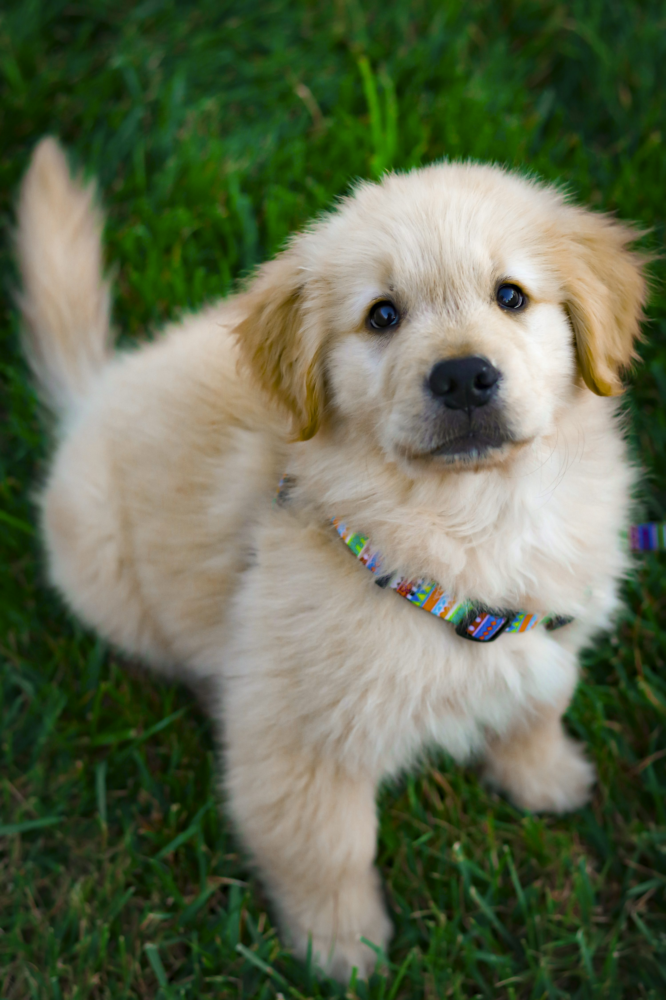

In [23]:

blob_client=blob_service_client.get_blob_client('createcontainer','Dog.jpg')
data=blob_client.download_blob()
from PIL import Image
Image.open(data)

**Access the Text File**

In [24]:
blob_client=blob_service_client.get_blob_client('createcontainer','sample.txt')
data=blob_client.download_blob()
import pandas as pd
pd.read_csv(data)

,Pydantic
0,Subscription
1,Azure subscription 1
2,Resource group
3,(New) AzureML
4,Region
5,East US 2
6,Name
7,AzureML
8,Storage account
9,(new) azureml7719782079
